# 🔍 Concrete Crack Detection — Pure Line Detection (No ML)
## How it works
For every image the algorithm:
1. Converts to **grayscale**
2. Applies **CLAHE** (contrast enhancement — makes hairline cracks visible)
3. Runs **Canny edge detection** to find edges
4. Runs **Probabilistic Hough Line Transform** to find line segments
5. Counts lines and measures their density
6. If `line_density > CRACK_THRESHOLD` → **CRACKED**, else → **NON-CRACKED**

No machine learning. No training. Pure computer vision rules.

## 📦 Cell 1 — Imports

In [14]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pathlib import Path
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    accuracy_score, f1_score, precision_score, recall_score
)

print("✔  All libraries imported successfully")

✔  All libraries imported successfully


## ⚙️ Cell 2 — Configuration
> **`CRACK_THRESHOLD`** is the only parameter you need to tune.
> It is the minimum **line density** (total line pixels / image pixels) above which an image is classified as **Cracked**.
> - **Lower** → more sensitive (catches subtle cracks, but more false positives)
> - **Higher** → stricter (fewer false alarms, but may miss hairline cracks)
> Start at `0.02` and adjust based on your results.

In [ ]:
# ╔══════════════════════════════════════════════════════════╗
# ║           CONFIGURATION  —  TUNE HERE                   ║
# ╠══════════════════════════════════════════════════════════╣
# ║  CRACK_THRESHOLD : line_density above which image       ║
# ║                    is classified as CRACKED.            ║
# ║  line_density = total Hough line length / total pixels  ║
# ║  Typical range: 0.01 – 0.05                             ║
# ╚══════════════════════════════════════════════════════════╝

CRACK_THRESHOLD = 0.02       # ← TUNE THIS

BASE_PATH = r"C:\Users\Kritvi Gera\Desktop\ICL\Data Project\2. Image processing\Project_Vision_Data_Group_A\Project_Vision_Data_Group_A_Processed"

POOLS = {
    "Walls": os.path.join(BASE_PATH, "Training_Pool_A_Walls"),
    "Decks": os.path.join(BASE_PATH, "Training_Pool_B_Decks"),
}

LABEL_MAP   = {"Cracked": 1, "Non-Cracked": 0}
LABEL_NAMES = {1: "Cracked", 0: "Non-Cracked"}

IMAGE_SIZE    = (256, 256)
SUPPORTED_EXT = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"}

# Canny edge detection thresholds
CANNY_LOW  = 50
CANNY_HIGH = 150

# Hough line parameters
HOUGH_THRESHOLD = 50    # minimum votes to accept a line
HOUGH_MIN_LINE  = 30    # minimum line length in pixels
HOUGH_MAX_GAP   = 10    # maximum gap to bridge between segments

print("✔  Configuration loaded")
print(f"   CRACK_THRESHOLD = {CRACK_THRESHOLD}")
print(f"   CANNY           = ({CANNY_LOW}, {CANNY_HIGH})")
print(f"   HOUGH min_line  = {HOUGH_MIN_LINE}px,  max_gap = {HOUGH_MAX_GAP}px")

✔  Configuration loaded
   CRACK_THRESHOLD = 0.05
   CANNY           = (50, 150)
   HOUGH min_line  = 30px,  max_gap = 10px


## 🛠️ Cell 3 — Core Detection Function
This single function does everything: preprocess → edge detect → Hough lines → classify.

In [16]:
def detect_cracks(img_path: str) -> dict:
    """
    Pure CV crack detection pipeline — no ML.

    Steps:
      1. Load image as grayscale
      2. Denoise with fastNlMeansDenoising
      3. Enhance contrast with CLAHE (critical for hairline cracks)
      4. Detect edges with Canny
      5. Find line segments with Probabilistic Hough Transform
      6. Compute line_density = total_line_length / total_pixels
      7. Classify: line_density > CRACK_THRESHOLD → Cracked

    Returns a dict with all intermediate results and the final prediction.
    """
    # ── 1. Load ───────────────────────────────────────────────────────────────
    img = cv2.imread(str(img_path))
    if img is None:
        raise FileNotFoundError(f"Cannot read: {img_path}")
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # ── 2. Denoise ────────────────────────────────────────────────────────────
    denoised = cv2.fastNlMeansDenoising(gray, h=10)

    # ── 3. CLAHE contrast enhancement ─────────────────────────────────────────
    clahe    = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(denoised)

    # ── 4. Resize ─────────────────────────────────────────────────────────────
    resized = cv2.resize(enhanced, IMAGE_SIZE)

    # ── 5. Canny edge detection ───────────────────────────────────────────────
    edges = cv2.Canny(resized, CANNY_LOW, CANNY_HIGH)

    # ── 6. Probabilistic Hough Line Transform ─────────────────────────────────
    lines = cv2.HoughLinesP(
        edges,
        rho=1,
        theta=np.pi / 180,
        threshold=HOUGH_THRESHOLD,
        minLineLength=HOUGH_MIN_LINE,
        maxLineGap=HOUGH_MAX_GAP,
    )

    # ── 7. Compute line density ───────────────────────────────────────────────
    total_pixels    = IMAGE_SIZE[0] * IMAGE_SIZE[1]
    total_line_len  = 0
    line_count      = 0

    # Build overlay image for visualisation
    overlay = cv2.cvtColor(resized, cv2.COLOR_GRAY2BGR)

    if lines is not None:
        for x1, y1, x2, y2 in lines[:, 0]:
            seg_len = np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
            total_line_len += seg_len
            line_count     += 1
            cv2.line(overlay, (x1, y1), (x2, y2), (0, 0, 255), 1)

    line_density = total_line_len / total_pixels

    # ── 8. Classify ───────────────────────────────────────────────────────────
    pred  = 1 if line_density > CRACK_THRESHOLD else 0   # 1=Cracked, 0=Non-Cracked

    return {
        "gray":         gray,
        "enhanced":     resized,
        "edges":        edges,
        "overlay":      cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB),
        "line_count":   line_count,
        "line_density": line_density,
        "pred":         pred,
        "pred_label":   LABEL_NAMES[pred],
    }


print("✔  detect_cracks() defined")
print(f"   Classification rule: line_density > {CRACK_THRESHOLD}  →  CRACKED")

✔  detect_cracks() defined
   Classification rule: line_density > 0.05  →  CRACKED


## ▶️ Cell 4 — Run Detection on All Images
This loops through every image in every section, runs `detect_cracks()`, and stores per-image results.

In [17]:
records = []   # one dict per image

print("Running crack detection on all images...\n")

for pool_name, pool_path in POOLS.items():
    for label_name, label_val in LABEL_MAP.items():
        folder = os.path.join(pool_path, label_name)
        if not os.path.isdir(folder):
            print(f"  ⚠  Folder not found: {folder}")
            continue

        files = sorted([
            f for f in Path(folder).iterdir()
            if f.suffix.lower() in SUPPORTED_EXT
        ])
        print(f"  📂  {pool_name} / {label_name}: {len(files)} images", end=" ... ")

        section_correct = 0
        for fp in files:
            try:
                result  = detect_cracks(str(fp))
                correct = (result["pred"] == label_val)
                if correct:
                    section_correct += 1

                records.append({
                    "path":         str(fp),
                    "filename":     fp.name,
                    "pool":         pool_name,
                    "section":      label_name,
                    "label":        label_val,
                    "pred":         result["pred"],
                    "pred_label":   result["pred_label"],
                    "line_count":   result["line_count"],
                    "line_density": result["line_density"],
                    "correct":      correct,
                })
            except Exception as e:
                print(f"\n    ✗  {fp.name}: {e}")

        pct = 100 * section_correct / len(files) if files else 0
        print(f"done  ({section_correct}/{len(files)} correct = {pct:.1f}%)")

print(f"\n{'─'*50}")
print(f"  Total images processed : {len(records)}")
print(f"  Cracked images         : {sum(1 for r in records if r['label']==1)}")
print(f"  Non-Cracked images     : {sum(1 for r in records if r['label']==0)}")
print(f"  Overall correct        : {sum(1 for r in records if r['correct'])}")
print(f"  Overall accuracy       : {100*sum(1 for r in records if r['correct'])/len(records):.2f}%")
print(f"{'─'*50}")

Running crack detection on all images...

  📂  Walls / Cracked: 3751 images ... done  (3492/3751 correct = 93.1%)
  📂  Walls / Non-Cracked: 14188 images ... done  (1632/14188 correct = 11.5%)
  📂  Decks / Cracked: 1926 images ... done  (1919/1926 correct = 99.6%)
  📂  Decks / Non-Cracked: 11496 images ... done  (251/11496 correct = 2.2%)

──────────────────────────────────────────────────
  Total images processed : 31361
  Cracked images         : 5677
  Non-Cracked images     : 25684
  Overall correct        : 7294
  Overall accuracy       : 23.26%
──────────────────────────────────────────────────


## 📋 Cell 5 — Per-Image Detection Report
For each section (Walls/Cracked, Walls/Non-Cracked, Decks/Cracked, Decks/Non-Cracked),
every image is listed with its filename, actual label, predicted label, line density, and ✔/✘ status.

In [18]:
sections = [
    ("Walls", "Cracked"),
    ("Walls", "Non-Cracked"),
    ("Decks", "Cracked"),
    ("Decks", "Non-Cracked"),
]

print("\n" + "═" * 95)
print(f"  PER-IMAGE LINE DETECTION RESULTS   "
      f"(CRACK_THRESHOLD = {CRACK_THRESHOLD})")
print("═" * 95)

grand_total = grand_correct = 0

for pool, section in sections:
    subset = [r for r in records if r["pool"] == pool and r["section"] == section]
    if not subset:
        continue

    n_correct   = sum(r["correct"] for r in subset)
    n_incorrect = len(subset) - n_correct
    pct         = 100 * n_correct / len(subset)
    class_note  = "Positive class" if section == "Cracked" else "Negative class"

    print(f"\n  ┌─ {pool.upper()}  —  {section.upper()}  ({class_note})")
    print(f"  │  Total images        : {len(subset)}")
    print(f"  │  Correctly detected  : {n_correct}  ({pct:.1f}%)")
    print(f"  │  Missed / Wrong      : {n_incorrect}  ({100-pct:.1f}%)")
    print(f"  │")
    print(f"  │  {'#':<5} {'FILENAME':<38} {'ACTUAL':<14} {'PREDICTED':<14} {'LINE DENSITY':<14} STATUS")
    print(f"  │  {'─'*5} {'─'*38} {'─'*14} {'─'*14} {'─'*14} {'─'*12}")

    for i, r in enumerate(subset, 1):
        status = "✔  CORRECT" if r["correct"] else "✘  INCORRECT"
        print(f"  │  {i:<5} {r['filename']:<38} "
              f"{LABEL_NAMES[r['label']]:<14} "
              f"{r['pred_label']:<14} "
              f"{r['line_density']:.6f}       "
              f"{status}")

    print(f"  └{'─'*94}")
    grand_total   += len(subset)
    grand_correct += n_correct

print("\n" + "═" * 95)
print("  GRAND SUMMARY")
print(f"  Total images evaluated  : {grand_total}")
print(f"  Correctly detected      : {grand_correct}  ({100*grand_correct/grand_total:.2f}%)")
print(f"  Incorrectly detected    : {grand_total-grand_correct}  ({100*(grand_total-grand_correct)/grand_total:.2f}%)")
print("═" * 95)


═══════════════════════════════════════════════════════════════════════════════════════════════
  PER-IMAGE LINE DETECTION RESULTS   (CRACK_THRESHOLD = 0.05)
═══════════════════════════════════════════════════════════════════════════════════════════════

  ┌─ WALLS  —  CRACKED  (Positive class)
  │  Total images        : 3751
  │  Correctly detected  : 3492  (93.1%)
  │  Missed / Wrong      : 259  (6.9%)
  │
  │  #     FILENAME                               ACTUAL         PREDICTED      LINE DENSITY   STATUS
  │  ───── ────────────────────────────────────── ────────────── ────────────── ────────────── ────────────
  │  1     7069-101.jpg                           Cracked        Cracked        0.727148       ✔  CORRECT
  │  2     7069-104.jpg                           Cracked        Cracked        0.652055       ✔  CORRECT
  │  3     7069-105.jpg                           Cracked        Cracked        0.582904       ✔  CORRECT
  │  4     7069-108.jpg                           Cracked  

## 📊 Cell 6 — Accuracy Metrics

In [19]:
y_true = np.array([r["label"] for r in records])
y_pred = np.array([r["pred"]  for r in records])

acc  = accuracy_score(y_true, y_pred)
f1   = f1_score(y_true, y_pred, zero_division=0)
prec = precision_score(y_true, y_pred, zero_division=0)
rec  = recall_score(y_true, y_pred, zero_division=0)
cm   = confusion_matrix(y_true, y_pred)
tn, fp, fn, tp = cm.ravel()

print(f"\n{'═'*55}")
print(f"  OVERALL METRICS  (threshold = {CRACK_THRESHOLD})")
print(f"{'═'*55}")
print(f"  Accuracy   : {acc:.4f}")
print(f"  Precision  : {prec:.4f}  (of flagged, how many truly cracked)")
print(f"  Recall     : {rec:.4f}  (of all cracks, how many were caught)")
print(f"  F1-Score   : {f1:.4f}")
print(f"{'─'*55}")
print(f"  TP — Cracked correctly flagged      : {tp}")
print(f"  TN — Non-Cracked correctly passed   : {tn}")
print(f"  FP — Non-Cracked wrongly flagged    : {fp}")
print(f"  FN — Cracked MISSED ⚠ (dangerous!) : {fn}")
print(f"{'═'*55}")


═══════════════════════════════════════════════════════
  OVERALL METRICS  (threshold = 0.05)
═══════════════════════════════════════════════════════
  Accuracy   : 0.2326
  Precision  : 0.1852  (of flagged, how many truly cracked)
  Recall     : 0.9531  (of all cracks, how many were caught)
  F1-Score   : 0.3102
───────────────────────────────────────────────────────
  TP — Cracked correctly flagged      : 5411
  TN — Non-Cracked correctly passed   : 1883
  FP — Non-Cracked wrongly flagged    : 23801
  FN — Cracked MISSED ⚠ (dangerous!) : 266
═══════════════════════════════════════════════════════


## 🧩 Cell 7 — Confusion Matrix

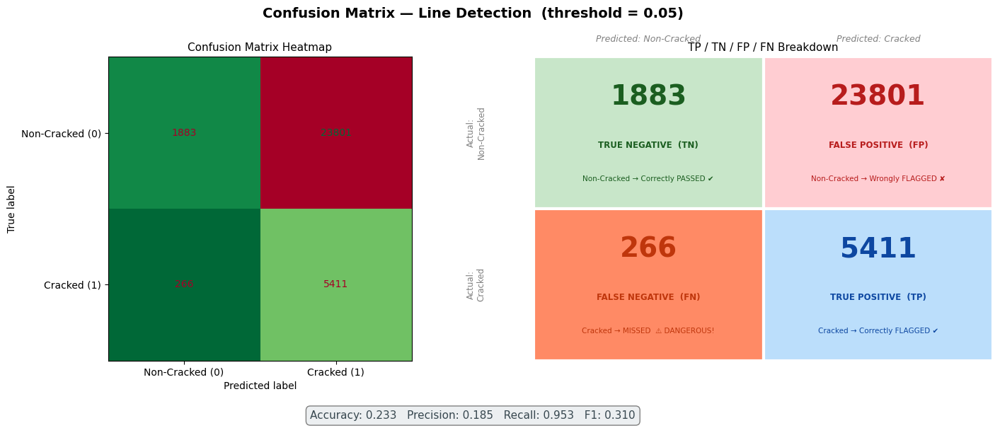

✔  Saved: confusion_matrix.png


In [20]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle(f"Confusion Matrix — Line Detection  (threshold = {CRACK_THRESHOLD})",
             fontsize=14, fontweight="bold")

# Left — standard heatmap
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=["Non-Cracked (0)", "Cracked (1)"])
disp.plot(ax=axes[0], colorbar=False, cmap="RdYlGn_r")
axes[0].set_title("Confusion Matrix Heatmap", fontsize=11)

# Right — annotated colour-coded breakdown
ax = axes[1]
ax.set_xlim(0, 2); ax.set_ylim(0, 2); ax.axis("off")
ax.set_title("TP / TN / FP / FN Breakdown", fontsize=11)

cells_info = [
    (0, 1, tn, "TRUE NEGATIVE  (TN)",  "Non-Cracked → Correctly PASSED ✔", "#C8E6C9", "#1B5E20"),
    (1, 1, fp, "FALSE POSITIVE  (FP)", "Non-Cracked → Wrongly FLAGGED ✘",  "#FFCDD2", "#B71C1C"),
    (0, 0, fn, "FALSE NEGATIVE  (FN)", "Cracked → MISSED  ⚠ DANGEROUS!",   "#FF8A65", "#BF360C"),
    (1, 0, tp, "TRUE POSITIVE  (TP)",  "Cracked → Correctly FLAGGED ✔",     "#BBDEFB", "#0D47A1"),
]
for (cx, cy, val, title, detail, bg, fg) in cells_info:
    ax.add_patch(plt.Rectangle((cx, cy), 1, 1, color=bg, ec="white", lw=3))
    ax.text(cx+0.5, cy+0.68, str(val),  ha="center", fontsize=28, fontweight="bold", color=fg)
    ax.text(cx+0.5, cy+0.40, title,     ha="center", fontsize=8.5, fontweight="bold", color=fg)
    ax.text(cx+0.5, cy+0.18, detail,    ha="center", fontsize=7.5, color=fg)

ax.text(0.5,  2.10, "Predicted: Non-Cracked", ha="center", fontsize=9, color="gray", style="italic")
ax.text(1.5,  2.10, "Predicted: Cracked",     ha="center", fontsize=9, color="gray", style="italic")
ax.text(-0.25, 1.5, "Actual:\nNon-Cracked", ha="center", va="center", fontsize=8.5, color="gray", rotation=90)
ax.text(-0.25, 0.5, "Actual:\nCracked",     ha="center", va="center", fontsize=8.5, color="gray", rotation=90)

summary = (f"Accuracy: {acc:.3f}   Precision: {prec:.3f}   "
           f"Recall: {rec:.3f}   F1: {f1:.3f}")
fig.text(0.5, 0.01, summary, ha="center", fontsize=11, color="#37474F",
         bbox=dict(boxstyle="round,pad=0.4", fc="#ECEFF1", ec="gray"))

plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.savefig("confusion_matrix.png", dpi=150, bbox_inches="tight")
plt.show()
print("✔  Saved: confusion_matrix.png")

## 📊 Cell 8 — Section Accuracy Charts

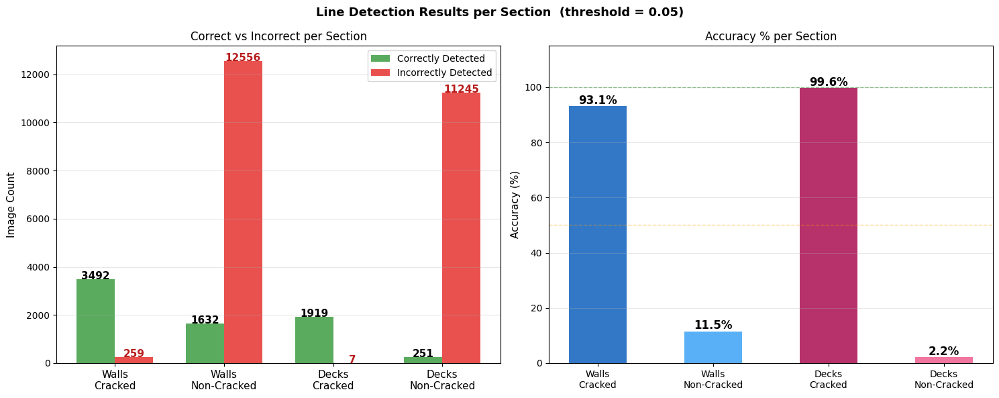

✔  Saved: section_accuracy.png


In [21]:
sections = [("Walls","Cracked"), ("Walls","Non-Cracked"),
            ("Decks","Cracked"), ("Decks","Non-Cracked")]

labels, correct_counts, incorrect_counts, pcts = [], [], [], []
for pool, section in sections:
    sub = [r for r in records if r["pool"]==pool and r["section"]==section]
    if not sub: continue
    nc = sum(r["correct"] for r in sub)
    labels.append(f"{pool}\n{section}")
    correct_counts.append(nc)
    incorrect_counts.append(len(sub) - nc)
    pcts.append(100 * nc / len(sub))

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle(f"Line Detection Results per Section  (threshold = {CRACK_THRESHOLD})",
             fontsize=13, fontweight="bold")

# Left — counts
x = np.arange(len(labels)); w = 0.35
b1 = axes[0].bar(x - w/2, correct_counts,   w, label="Correctly Detected",   color="#43A047", alpha=0.88)
b2 = axes[0].bar(x + w/2, incorrect_counts, w, label="Incorrectly Detected", color="#E53935", alpha=0.88)
for b in b1:
    h = b.get_height()
    axes[0].text(b.get_x()+b.get_width()/2, h+0.3, str(int(h)),
                 ha="center", fontsize=11, fontweight="bold")
for b in b2:
    h = b.get_height()
    axes[0].text(b.get_x()+b.get_width()/2, h+0.3, str(int(h)),
                 ha="center", fontsize=11, fontweight="bold", color="#B71C1C")
axes[0].set_xticks(x); axes[0].set_xticklabels(labels, fontsize=11)
axes[0].set_ylabel("Image Count", fontsize=11)
axes[0].set_title("Correct vs Incorrect per Section")
axes[0].legend(fontsize=10); axes[0].grid(axis="y", alpha=0.3)

# Right — accuracy %
bar_colors = ["#1565C0", "#42A5F5", "#AD1457", "#F06292"]
bars = axes[1].bar(labels, pcts, color=bar_colors[:len(labels)], alpha=0.88, width=0.5)
axes[1].axhline(100, color="green",  lw=1, ls="--", alpha=0.4)
axes[1].axhline(50,  color="orange", lw=1, ls="--", alpha=0.4, label="50% (chance)")
for b, p in zip(bars, pcts):
    axes[1].text(b.get_x()+b.get_width()/2, p+0.8,
                 f"{p:.1f}%", ha="center", fontsize=12, fontweight="bold")
axes[1].set_ylim(0, 115); axes[1].set_ylabel("Accuracy (%)", fontsize=11)
axes[1].set_title("Accuracy % per Section"); axes[1].grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.savefig("section_accuracy.png", dpi=150, bbox_inches="tight")
plt.show()
print("✔  Saved: section_accuracy.png")

## 📉 Cell 9 — Line Density Distribution
Shows how line density separates Cracked from Non-Cracked images.
The vertical line is your `CRACK_THRESHOLD`.

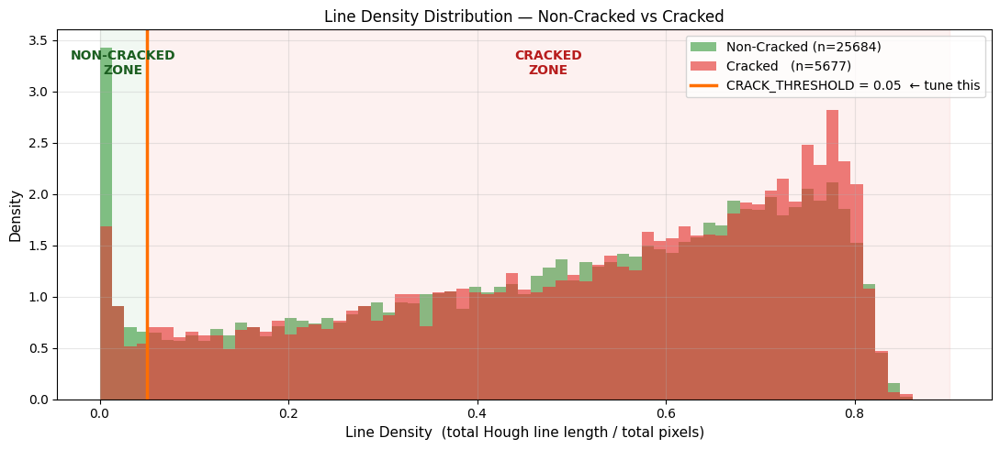

✔  Saved: line_density_distribution.png


In [22]:
densities_cracked     = [r["line_density"] for r in records if r["label"] == 1]
densities_non_cracked = [r["line_density"] for r in records if r["label"] == 0]

fig, ax = plt.subplots(figsize=(11, 5))
bins = np.linspace(0, max(max(densities_cracked), max(densities_non_cracked)) * 1.05, 70)

ax.hist(densities_non_cracked, bins=bins, alpha=0.65, color="#43A047",
        label=f"Non-Cracked (n={len(densities_non_cracked)})", density=True)
ax.hist(densities_cracked,     bins=bins, alpha=0.65, color="#E53935",
        label=f"Cracked   (n={len(densities_cracked)})", density=True)

ax.axvline(CRACK_THRESHOLD, color="#FF6F00", lw=2.5, ls="-",
           label=f"CRACK_THRESHOLD = {CRACK_THRESHOLD}  ← tune this")

ax.axvspan(0,               CRACK_THRESHOLD, alpha=0.07, color="#43A047")
ax.axvspan(CRACK_THRESHOLD, bins[-1],        alpha=0.07, color="#E53935")

ymax = ax.get_ylim()[1]
ax.text(CRACK_THRESHOLD * 0.5,         ymax * 0.88,
        "NON-CRACKED\nZONE", color="#1B5E20", ha="center", fontsize=10, fontweight="bold")
ax.text(CRACK_THRESHOLD + (bins[-1]-CRACK_THRESHOLD)*0.5, ymax * 0.88,
        "CRACKED\nZONE",     color="#B71C1C", ha="center", fontsize=10, fontweight="bold")

ax.set_xlabel("Line Density  (total Hough line length / total pixels)", fontsize=11)
ax.set_ylabel("Density", fontsize=11)
ax.set_title("Line Density Distribution — Non-Cracked vs Cracked", fontsize=12)
ax.legend(fontsize=10); ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig("line_density_distribution.png", dpi=150, bbox_inches="tight")
plt.show()
print("✔  Saved: line_density_distribution.png")

## 🎚️ Cell 10 — Threshold Sensitivity Analysis
Sweep every possible threshold value and see how accuracy and TP/TN/FP/FN change.
Use this chart to pick the best `CRACK_THRESHOLD` for your data.

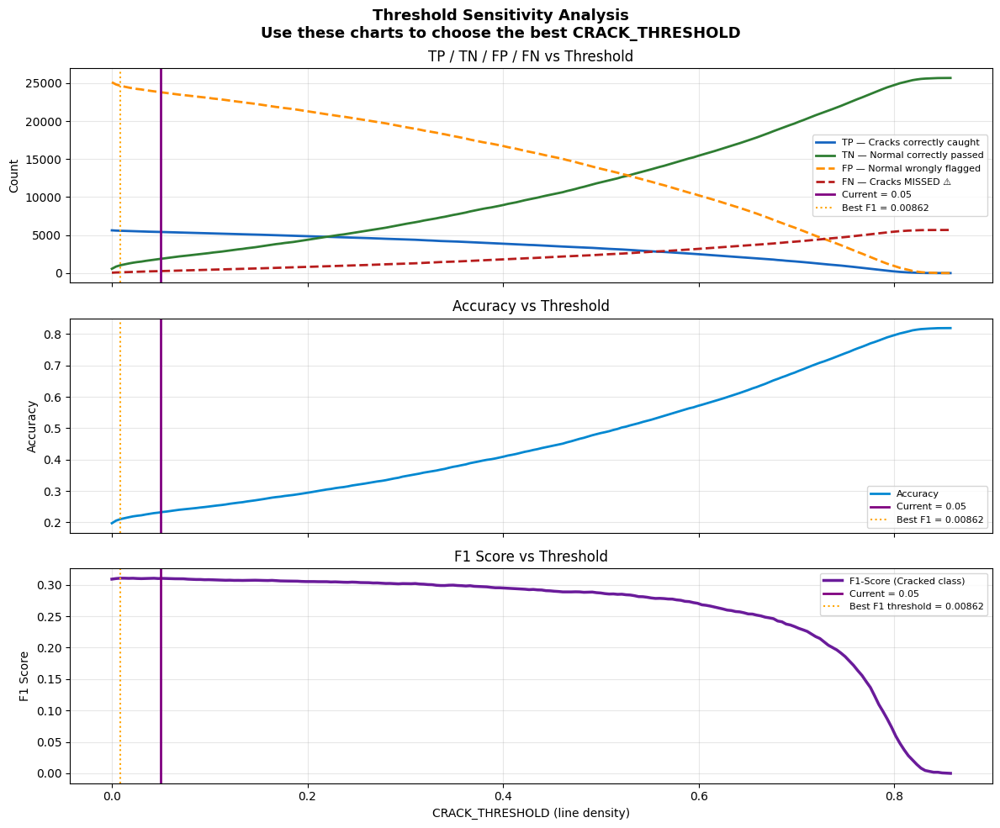

✔  Saved: threshold_sensitivity.png

  💡  Data-driven best threshold : 0.008619  (F1 = 0.3105)
      Your current threshold      : 0.05


In [23]:
all_densities = np.array([r["line_density"] for r in records])
y_true_all    = np.array([r["label"]        for r in records])

thresholds = np.linspace(all_densities.min(), all_densities.max(), 200)
accs, f1s   = [], []
tps, tns, fps, fns = [], [], [], []

for t in thresholds:
    preds = (all_densities > t).astype(int)
    cm_t  = confusion_matrix(y_true_all, preds)
    tn_t, fp_t, fn_t, tp_t = cm_t.ravel()
    tps.append(tp_t); tns.append(tn_t); fps.append(fp_t); fns.append(fn_t)
    accs.append(accuracy_score(y_true_all, preds))
    f1s.append(f1_score(y_true_all, preds, zero_division=0))

best_thresh_idx = np.argmax(f1s)
best_thresh     = thresholds[best_thresh_idx]

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 10), sharex=True)
fig.suptitle("Threshold Sensitivity Analysis\n"
             "Use these charts to choose the best CRACK_THRESHOLD",
             fontsize=13, fontweight="bold")

ax1.plot(thresholds, tps, label="TP — Cracks correctly caught",  color="#1565C0", lw=2)
ax1.plot(thresholds, tns, label="TN — Normal correctly passed",  color="#2E7D32", lw=2)
ax1.plot(thresholds, fps, label="FP — Normal wrongly flagged",   color="#FF8F00", lw=2, ls="--")
ax1.plot(thresholds, fns, label="FN — Cracks MISSED ⚠",         color="#B71C1C", lw=2, ls="--")
ax1.axvline(CRACK_THRESHOLD, color="purple", lw=2,  label=f"Current = {CRACK_THRESHOLD}")
ax1.axvline(best_thresh,     color="orange", lw=1.5, ls=":", label=f"Best F1 = {best_thresh:.5f}")
ax1.set_ylabel("Count"); ax1.legend(fontsize=8); ax1.grid(alpha=0.3)
ax1.set_title("TP / TN / FP / FN vs Threshold")

ax2.plot(thresholds, accs, color="#0288D1", lw=2, label="Accuracy")
ax2.axvline(CRACK_THRESHOLD, color="purple", lw=2,  label=f"Current = {CRACK_THRESHOLD}")
ax2.axvline(best_thresh,     color="orange", lw=1.5, ls=":", label=f"Best F1 = {best_thresh:.5f}")
ax2.set_ylabel("Accuracy"); ax2.legend(fontsize=8); ax2.grid(alpha=0.3)
ax2.set_title("Accuracy vs Threshold")

ax3.plot(thresholds, f1s, color="#6A1B9A", lw=2.5, label="F1-Score (Cracked class)")
ax3.axvline(CRACK_THRESHOLD, color="purple", lw=2,  label=f"Current = {CRACK_THRESHOLD}")
ax3.axvline(best_thresh,     color="orange", lw=1.5, ls=":", label=f"Best F1 threshold = {best_thresh:.5f}")
ax3.set_xlabel("CRACK_THRESHOLD (line density)")
ax3.set_ylabel("F1 Score"); ax3.legend(fontsize=8); ax3.grid(alpha=0.3)
ax3.set_title("F1 Score vs Threshold")

plt.tight_layout()
plt.savefig("threshold_sensitivity.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"✔  Saved: threshold_sensitivity.png")
print(f"\n  💡  Data-driven best threshold : {best_thresh:.6f}  (F1 = {max(f1s):.4f})")
print(f"      Your current threshold      : {CRACK_THRESHOLD}")

## 🖼️ Cell 11 — Detection Pipeline Visualisation
Shows the step-by-step detection pipeline for one sample from each section.

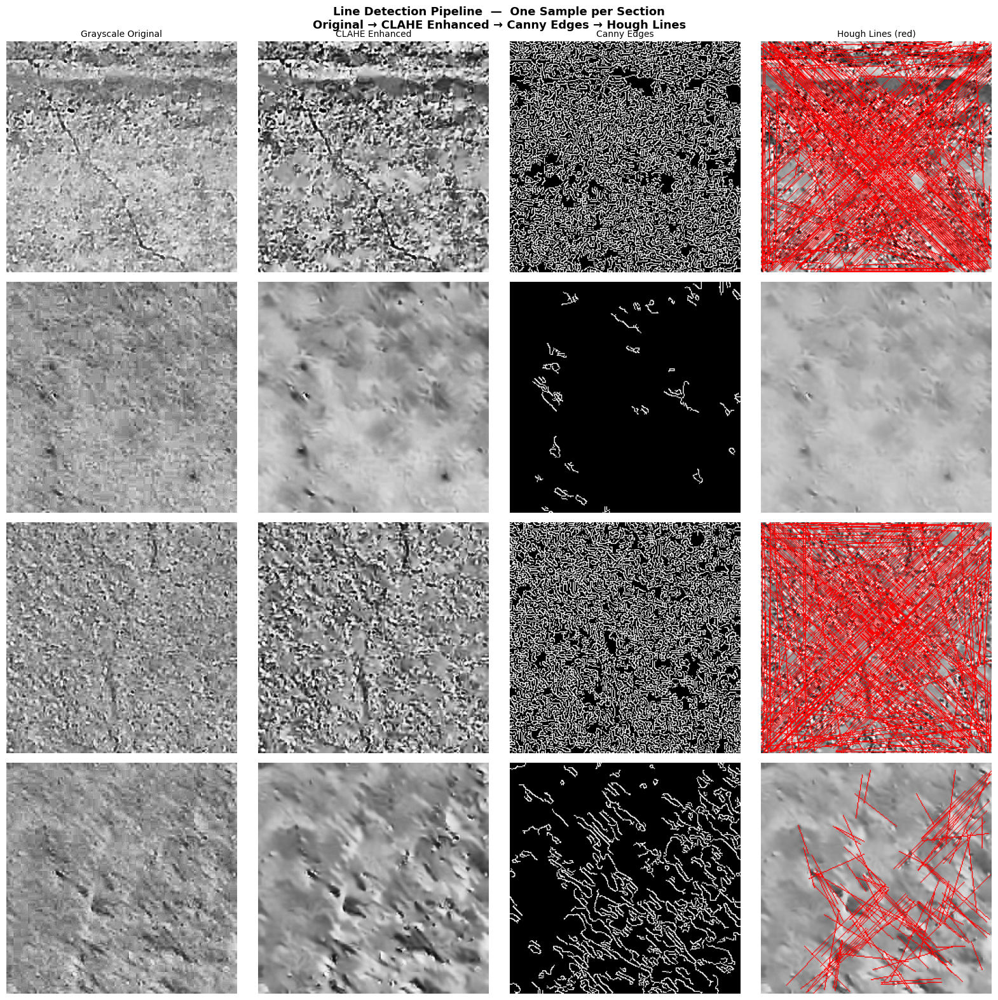

✔  Saved: pipeline_samples.png


In [24]:
sections = [("Walls","Cracked"), ("Walls","Non-Cracked"),
            ("Decks","Cracked"), ("Decks","Non-Cracked")]

# Pick first image from each section
samples = []
for pool, section in sections:
    sub = [r for r in records if r["pool"]==pool and r["section"]==section]
    if sub:
        samples.append(sub[0])

n = len(samples)
fig, axes = plt.subplots(n, 4, figsize=(16, n * 4))
fig.suptitle("Line Detection Pipeline  —  One Sample per Section\n"
             "Original → CLAHE Enhanced → Canny Edges → Hough Lines",
             fontsize=13, fontweight="bold")

col_titles = ["Grayscale Original", "CLAHE Enhanced", "Canny Edges", "Hough Lines (red)"]
for j, t in enumerate(col_titles):
    axes[0, j].set_title(t, fontsize=10)

for row, r in enumerate(samples):
    result  = detect_cracks(r["path"])
    status  = "✔ CORRECT" if r["correct"] else "✘ INCORRECT"
    color   = "#1B5E20" if r["correct"] else "#B71C1C"
    row_lbl = (f"{r['pool']} / {r['section']}\n"
               f"Actual: {LABEL_NAMES[r['label']]}  →  Predicted: {r['pred_label']}\n"
               f"Line density: {r['line_density']:.6f}  |  {status}")

    axes[row, 0].imshow(result["gray"],     cmap="gray")
    axes[row, 1].imshow(result["enhanced"], cmap="gray")
    axes[row, 2].imshow(result["edges"],    cmap="gray")
    axes[row, 3].imshow(result["overlay"])

    for ax in axes[row]:
        ax.axis("off")
    axes[row, 0].set_ylabel(row_lbl, fontsize=8, color=color, rotation=0, labelpad=150)

plt.tight_layout()
plt.savefig("pipeline_samples.png", dpi=150, bbox_inches="tight")
plt.show()
print("✔  Saved: pipeline_samples.png")

## ✅❌ Cell 12 — Correct & Incorrect Detection Grids per Section
For each section: up to 4 correctly detected and 4 incorrectly detected images side-by-side
with Hough line overlay, actual label, predicted label, and line density.

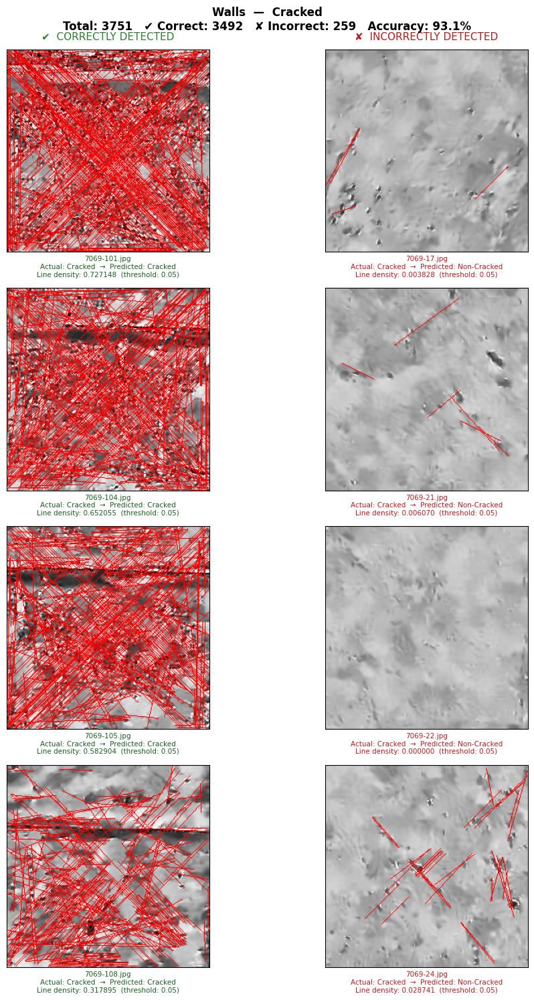

✔  Saved: grid_Walls_Cracked.png


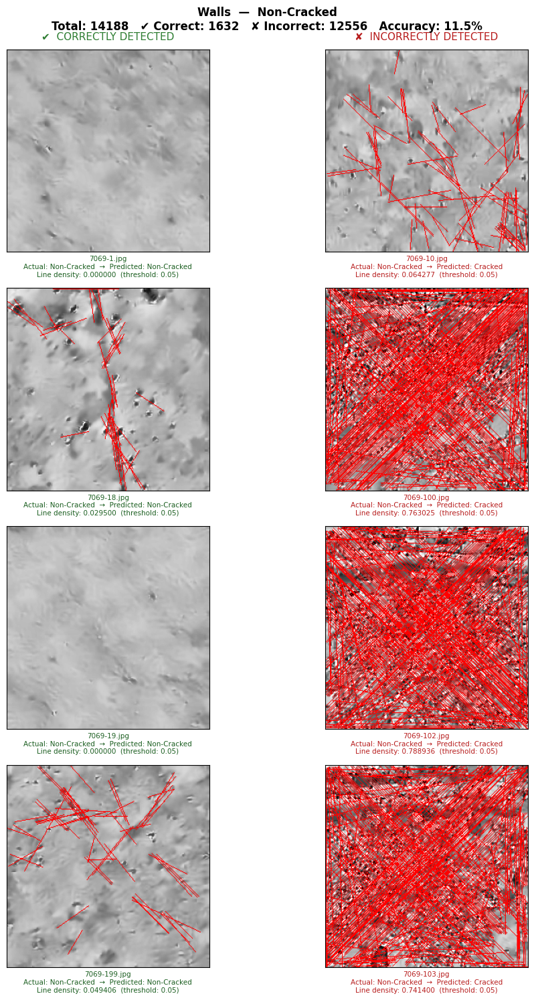

✔  Saved: grid_Walls_Non_Cracked.png


In [ ]:
sections = [("Walls","Cracked"), ("Walls","Non-Cracked"),
            ("Decks","Cracked"), ("Decks","Non-Cracked")]

n_each = 4   # images to show per correct / incorrect column

for pool, section in sections:
    subset = [r for r in records if r["pool"]==pool and r["section"]==section]
    if not subset: continue

    correct_recs   = [r for r in subset if r["correct"]][:n_each]
    incorrect_recs = [r for r in subset if not r["correct"]][:n_each]
    n_rows = max(len(correct_recs), len(incorrect_recs))
    if n_rows == 0:
        print(f"  {pool}/{section}: no images to show")
        continue

    fig, axes = plt.subplots(n_rows, 2, figsize=(11, n_rows * 3.8))
    if n_rows == 1:
        axes = np.expand_dims(axes, 0)

    tc = sum(1 for r in subset if r["correct"])
    ti = len(subset) - tc
    fig.suptitle(
        f"{pool}  —  {section}\n"
        f"Total: {len(subset)}   ✔ Correct: {tc}   ✘ Incorrect: {ti}   "
        f"Accuracy: {100*tc/len(subset):.1f}%",
        fontsize=12, fontweight="bold"
    )
    axes[0, 0].set_title("✔  CORRECTLY DETECTED",   color="#2E7D32", fontsize=11, pad=10)
    axes[0, 1].set_title("✘  INCORRECTLY DETECTED", color="#B71C1C", fontsize=11, pad=10)

    for row in range(n_rows):
        for col, recs in enumerate([correct_recs, incorrect_recs]):
            ax = axes[row, col]
            if row < len(recs):
                r      = recs[row]
                result = detect_cracks(r["path"])
                ax.imshow(result["overlay"])
                caption = (f"{r['filename']}\n"
                           f"Actual: {LABEL_NAMES[r['label']]}  →  "
                           f"Predicted: {r['pred_label']}\n"
                           f"Line density: {r['line_density']:.6f}  "
                           f"(threshold: {CRACK_THRESHOLD})")
                ax.set_xlabel(caption, fontsize=7.5,
                              color="#1B5E20" if r["correct"] else "#B71C1C")
            else:
                ax.set_visible(False)
            ax.set_xticks([]); ax.set_yticks([])

    plt.tight_layout()
    safe = f"grid_{pool}_{section.replace(' ','_').replace('-','_')}.png"
    plt.savefig(safe, dpi=130, bbox_inches="tight")
    plt.show()
    print(f"✔  Saved: {safe}")

## 🔎 Cell 13 — Single Image Inference
Run the detector on any new image. Uncomment the last line and set your path.

In [ ]:
def predict_single_image(img_path: str):
    """Run crack detection on one new image and display results."""
    result = detect_cracks(img_path)
    label  = ("🔴  CRACKED  (ANOMALY DETECTED)"
              if result["pred"] == 1
              else "🟢  NON-CRACKED  (NORMAL)")

    print(f"  Image        : {img_path}")
    print(f"  Line count   : {result['line_count']}")
    print(f"  Line density : {result['line_density']:.6f}  (threshold = {CRACK_THRESHOLD})")
    print(f"  Prediction   : {label}")

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    fig.suptitle(f"{label}  |  Line density = {result['line_density']:.6f}  "
                 f"|  Threshold = {CRACK_THRESHOLD}", fontsize=11)
    for ax, img, cmap, title in zip(
        axes,
        [result["gray"], result["enhanced"], result["edges"], result["overlay"]],
        ["gray", "gray", "gray", None],
        ["Grayscale", "CLAHE Enhanced", "Canny Edges", "Hough Lines"]
    ):
        ax.imshow(img, cmap=cmap)
        ax.set_title(title)
        ax.axis("off")
    plt.tight_layout()
    plt.savefig("single_prediction.png", dpi=150, bbox_inches="tight")
    plt.show()
    return result


# ── Uncomment and set your image path ─────────────────────────────────────────
# predict_single_image(r"C:\path\to\your\image.jpg")